**MULTICLASS CLASSIFICATION OF DRY BEANS USING COMPUTER VISION AND MACHINE LEARNING TECHNIQUES**

Analysis done by Dheeraj Dhillon 

Dataset provided by Murat Koklu, Ilker Ali Ozkan

**IMPORTING LIBRARIES**

In [1]:
import numpy as np  
import pandas as pd
import seaborn as sns
sns.set()
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
%matplotlib notebook

import os
import torch 
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

import xgboost
from xgboost import XGBClassifier
from mlxtend.plotting import plot_decision_regions

from pylab import rcParams
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

from sklearn import svm
from sklearn import metrics
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn_pandas import DataFrameMapper
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report 

**READING DATASET**

Dataset of the dry beans is imported as a dataframe using the pandas library. It is then converted into various forms containing features and/or label classes in either string or integer form in both pandas dataframe and numpy array format.

In [2]:
df = pd.read_excel("./sample_data/Dry_Bean_Dataset.xlsx")
df_int = df.copy()
class2idx = {"BARBUNYA":0,"BOMBAY":1,"CALI":2,"DERMASON":3,"HOROZ":4,"SEKER":5,"SIRA":6}
idx2class = {v: k for k, v in class2idx.items()}
df_f = df.drop(columns=['Class'])               #df_f     : dataframe with features only
df_int['Class'].replace(class2idx,inplace=True) #df_int   : dataframe with classes mapped as integers
df_c_str = df['Class']                          #df_c_str : dataframe with only classes column in strings
df_c_int = df_int['Class']                      #df_c_int : dataframe with only classes column in integers 
x = np.array(df_f)                              #x        : numpy array containing features without standard scaling
y_str = np.array(df_c_str)                      #y_str    : numpy array containing class labels in str
y_int = np.array(df_c_int)                      #y_int    : numpy array containing class labels in int

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)              #x_scaled : numpy array containing features after StandardScaling

mapper = DataFrameMapper([(df_f.columns, StandardScaler())])
scaled_features = mapper.fit_transform(df_f.copy())
df_f_scaled = pd.DataFrame(scaled_features,
        index=df_f.index,columns=df_f.columns)  #df_f_scaled   : dataframe with standard scaled features only
df_scaled_str = df_f_scaled.copy()              
df_scaled_int = df_f_scaled.copy()              
df_scaled_str['Class']=df['Class']              #df_scaled_str : dataframe with standard scaled features and class labels as str
df_scaled_int['Class']=df_int['Class']          #df_scaled_int : dataframe with standard scaled features and class labels as int

#For modelling purposes, the data is split into training and validation sets of numpy array format 
#with 70%-30% train-val split for both standardScaled data and non-standardized data:

x_sc_train,x_sc_test,y_sc_train,y_sc_test=train_test_split(x_scaled,y_int,test_size=0.3,stratify=y_int,random_state=22)
x_train,x_test,y_train,y_test=train_test_split(x,y_int,test_size=.3,stratify=y_int,random_state=22)

**OBSERVING THE DRY BEANS DATASET**

In [ ]:
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [4]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [ ]:
#df.nunique()

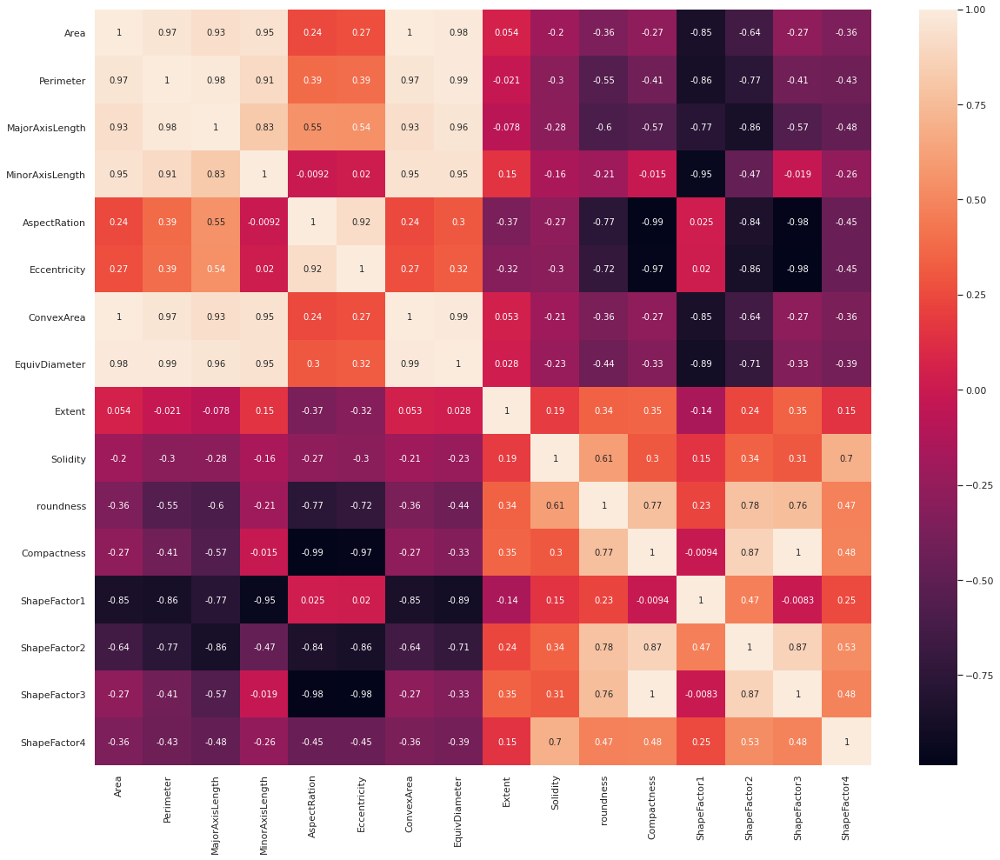

In [5]:
corrMatrix = df.corr()
plt.subplots(figsize=(20,16))
sns.heatmap(corrMatrix,annot=True)

In [ ]:
#sns.pairplot(df,hue='Class')

In [ ]:
#df_scaled_str.boxplot(by="Class", layout=(4,4), figsize=(20,20))

In [6]:
def bar_chart(feature):
    dermason=df[df['Class']=='DERMASON'][feature].value_counts()
    sira=df[df['Class']=='SIRA'][feature].value_counts()
    seker=df[df['Class']=='SEKER'][feature].value_counts()
    horoz=df[df['Class']=='HOROZ'][feature].value_counts()
    cali=df[df['Class']=='CALI'][feature].value_counts()
    barbunya=df[df['Class']=='BARBUNYA'][feature].value_counts()
    bombay=df[df['Class']=='BOMBAY'][feature].value_counts()
    dff = pd.DataFrame([barbunya,bombay,cali,dermason,horoz,seker,sira])
    dff.index = ['BARUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA']
    dff.plot(kind='bar',stacked=True,figsize=(10,5))

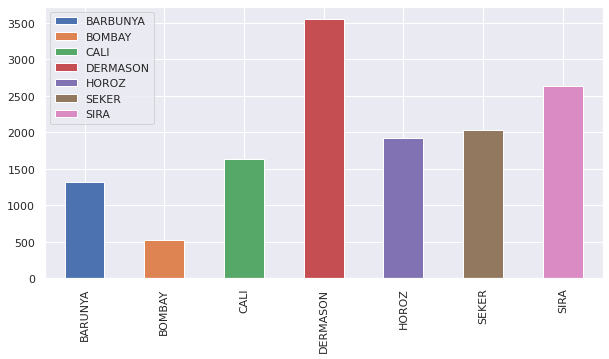

In [7]:
bar_chart('Class')

In [8]:
df['Class'].value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

**DATASET ANALYSIS**

First we will use various data analysis methods to understand the distribution of data and get a glimpse of the features and their importance in classification decision making.

These teachniques are:

1. Decision Trees
2. Random forests
3. Principal component analysis
4. t-SNE analysis

**FEATURE IMPORTANCE & SELECTION**

Feature importance refers to a class of techniques for assigning scores to input features to a predictive model that indicates the relative importance of each feature when making a prediction.

The scores are useful and can be used in a range of situations in a predictive modeling problem, such as:

1. Better understanding the data.
2. Better understanding a model.
3. Reducing the number of input features.

There are many ways to calculate feature importance scores and many models that can be used for this purpose which are explained below.

**DECISION TREES**

A decision tree is a decision support tool that uses a tree-like graphic or model to show its decisions and possible results. DT is used to determine the path to be followed in a decision analysis. Because of their cheap installation, easy interpretation, easy integration with database systems and good reliability, DT is widely used in classification models. It has the advantages of using visually and intuitively and being understood.
In this study, the maximum number of partitions for decision trees is 16 at the classification stage. The criterion of partition in decision trees was selected as Ginis diversity index. The decision tree obtained in this study is also shown below.

In [ ]:
dt_max = DecisionTreeClassifier(criterion="gini",random_state=100)
dt_lite = DecisionTreeClassifier(criterion="gini",random_state=100,max_depth=6)

dt_max.fit(x,y_int)
dt_lite.fit(x,y_int);

In [ ]:
#visualizing the tree
import io
from io import StringIO
from sklearn.tree import export_graphviz
# from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
from pydot import graph_from_dot_data

In [ ]:
dot_data = StringIO()
export_graphviz(dt_max,out_file=dot_data,filled=True,rounded=True,
      special_characters=True,feature_names=df_f.columns,
      class_names=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
(graph, ) = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

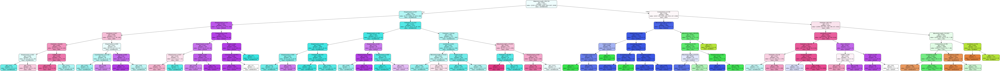

In [ ]:
dot_data = StringIO()
export_graphviz(dt_lite,out_file=dot_data,filled=True,rounded=True,
      special_characters=True,feature_names=df_f.columns,
      class_names=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
(graph, ) = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

**Calculating Feature Importance** for both lite and max models of our decision tree


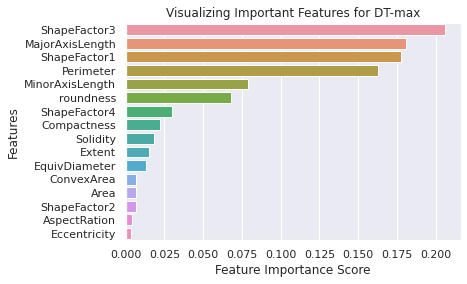

In [ ]:
feature_imp_dt_max = pd.Series(dt_max.feature_importances_,index=df_f.columns).sort_values(ascending=False)
sns.barplot(x=feature_imp_dt_max, y=feature_imp_dt_max.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features for DT-max")
plt.show()

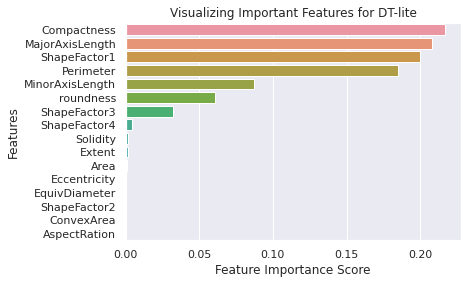

In [ ]:
feature_imp_dt_lite = pd.Series(dt_lite.feature_importances_,index=df_f.columns).sort_values(ascending=False)
feature_imp_dt_lite;
sns.barplot(x=feature_imp_dt_lite, y=feature_imp_dt_lite.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features for DT-lite")
plt.show()

**RANDOM FORESTS**

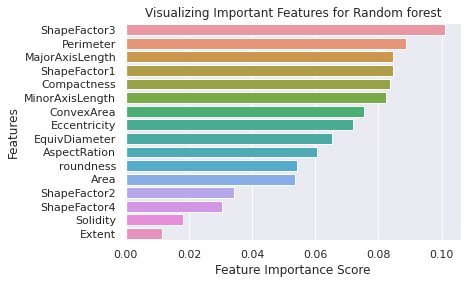

In [ ]:
rf = RandomForestClassifier(n_estimators=100,criterion='gini',bootstrap=True,random_state=42,oob_score=True,n_jobs=-1)
rf.fit(x,y_int)
feature_imp_rf = pd.Series(rf.feature_importances_,index=df_f.columns).sort_values(ascending=False)
sns.barplot(x=feature_imp_rf, y=feature_imp_rf.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features for Random forest")
plt.show()

**XGBOOST CLASSIFIER**

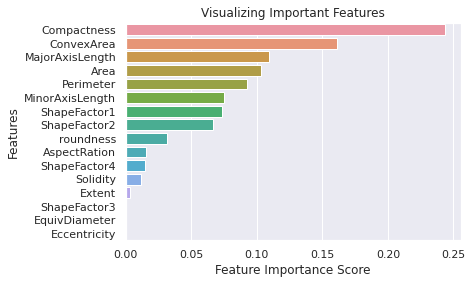

In [ ]:
xgb = XGBClassifier()
xgb.fit(x,y_str);
feature_imp_xgb = pd.Series(xgb.feature_importances_,index=df_f.columns).sort_values(ascending=False)
sns.barplot(x=feature_imp_xgb, y=feature_imp_xgb.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

In [ ]:
def imp_df(column_names, importances):
    df = pd.DataFrame({'feature': column_names,
                       'feature_importance': importances}) \
           .sort_values('feature_importance', ascending = False) \
           .reset_index(drop = True)
    return df

# plotting a feature importance dataframe (horizontal barchart)
def var_imp_plot(imp_df, title):
    imp_df.columns = ['feature', 'feature_importance']
    sns.barplot(x = 'feature_importance', y = 'feature', data = imp_df, orient = 'h', color = 'royalblue') \
       .set_title(title, fontsize = 20)

In [ ]:

from sklearn.base import clone 

def drop_col_feat_imp(model, X_train, y_train, random_state = 42):
    
    # clone the model to have the exact same specification as the one initially trained
    model_clone = clone(model)
    # set random_state for comparability
    model_clone.random_state = random_state
    # training and scoring the benchmark model
    model_clone.fit(X_train, y_train)
    benchmark_score = model_clone.score(X_train, y_train)
    # list for storing feature importances
    importances = []
    
    # iterating over all columns and storing feature importance (difference between benchmark and new model)
    for col in X_train.columns:
        model_clone = clone(model)
        model_clone.random_state = random_state
        model_clone.fit(X_train.drop(col, axis = 1), y_train)
        drop_col_score = model_clone.score(X_train.drop(col, axis = 1), y_train)
        importances.append(benchmark_score - drop_col_score)
    
    importances_df = imp_df(X_train.columns, importances)
    return importances_df

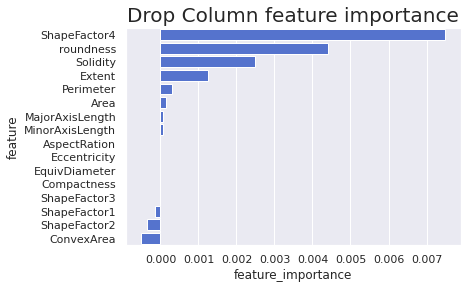

In [ ]:
drop_imp = drop_col_feat_imp(xgb,df_f,df_c_str)
var_imp_plot(drop_imp, 'Drop Column feature importance')

We may take into account the various feature importances obtained above by various classifier methods during our multi-class classification modelling of the dataset.

**DATA VISUALIZATION**

Data visualization is very helpful in trying to understand data by placing it in a visual context so that patterns, trends and correlations that might not otherwise be detected can be exposed.

Here we have 16 features for the given dataset, it is next to impossible to visualize all of them in a single plot. Moreover as we have seen above in the feature importance and selection section, several features are present which do not help much in classification of the samples like Eccentricity, EquivDiameter , Extent and more. Fortunately, their are various methods to overcome these issues by dimentionality reduction which transforms the data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension. 

We will do dimentionality reduction to both two and three dimensions and perform feature projection.

**PRINCIPAL COMPONENTS ANALYSIS**

PCA is a linear technique for dimensionality reduction as it performs a linear mapping of the data to a lower-dimensional space in such a way that the variance of the data in the low-dimensional representation is maximized. In practice, the covariance (and sometimes the correlation) matrix of the data is constructed and the eigenvectors on this matrix are computed. The eigenvectors that correspond to the largest eigenvalues (the principal components) can now be used to reconstruct a large fraction of the variance of the original data. 

The first few eigenvectors can often be interpreted in terms of the large-scale physical behavior of the system, because they often contribute the vast majority of the system's energy, especially in low-dimensional systems. 

We will perform PCA for both two and three components.

In [9]:
pca2 = PCA(n_components=2)
pca3 = PCA(n_components=3)

pca2_cmps = pca2.fit_transform(x_scaled)
x_pca2_cmps = np.array(pca2_cmps)

pca3_cmps = pca3.fit_transform(x_scaled)
x_pca3_cmps = np.array(pca3_cmps)

pca2_df = pd.DataFrame(data=pca2_cmps,columns=['principal component 1','principal component 2'])
pca3_df = pd.DataFrame(data=pca3_cmps,columns=['principal component 1','principal component 2','principal component 3'])

pc2df = pd.concat([pca2_df,df[['Class']]],axis=1)
pc3df = pd.concat([pca3_df,df[['Class']]],axis=1)

x_pc2_train,x_pc2_test,y_pc2_train,y_pc2_test = train_test_split(x_pca2_cmps,y_int,test_size=.3,stratify=y_int,random_state=22)
x_pc3_train,x_pc3_test,y_pc3_train,y_pc3_test = train_test_split(x_pca3_cmps,y_int,test_size=.3,stratify=y_int,random_state=22)

In [10]:
pca2.explained_variance_ratio_

array([0.55466439, 0.26430973])

In [11]:
pca3.explained_variance_ratio_

array([0.55466439, 0.26430973, 0.08006564])

In [12]:
pca3.explained_variance_ratio_.sum()

0.8990397601987458

1st component holds 55.46 % of the original variance while the 2nd component holds 26.43 % of the original variance. Together they hold 81.9 % variance of the original data which is quite fine as we retained that much variance after reducing the number of dimensions from 16 to 2. 

And if we do three component PCA, amount of variance retained becomes 89.9 %.

We will plot both PCAs using 2D and 3D plots.

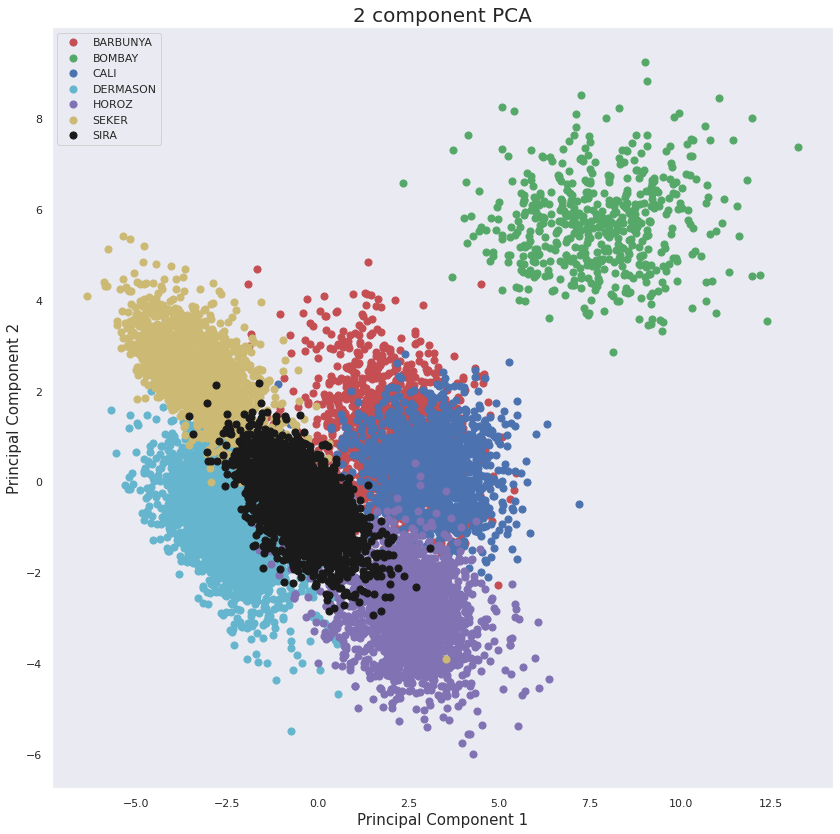

In [ ]:
fig = plt.figure(figsize = (14,14))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA',fontsize=20)
targets=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA']
colors=['r','g','b','c','m','y','k']
for target, color in zip(targets,colors):
    indices = pc2df['Class'] == target
    ax.scatter(pc2df.loc[indices,'principal component 1'],pc2df.loc[indices,'principal component 2'],c=color,s=50)
ax.legend(targets)
ax.grid()

3-D Plot

In [13]:
import plotly.express as px

In [14]:
fig = px.scatter_3d(pc3df, x='principal component 1', y='principal component 2', z='principal component 3',color='Class',size_max=100,)
fig.show()

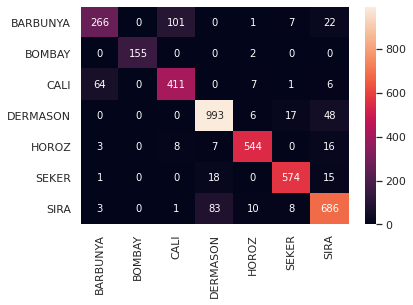

In [ ]:
rbf_pc3 = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf_pc3.fit(x_pc3_train,y_pc3_train)
y_rbf_pc3_pred = rbf_pc3.predict(x_pc3_test)
confusion_matrix_rbf_pc3 = pd.DataFrame(confusion_matrix(y_pc3_test,y_rbf_pc3_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf_pc3,annot=True,fmt='g')

In [ ]:
print(classification_report(y_pc3_test,y_rbf_pc3_pred,digits=4))

              precision    recall  f1-score   support

           0     0.7893    0.6700    0.7248       397
           1     1.0000    0.9873    0.9936       157
           2     0.7889    0.8405    0.8139       489
           3     0.9019    0.9333    0.9173      1064
           4     0.9544    0.9412    0.9477       578
           5     0.9456    0.9441    0.9449       608
           6     0.8651    0.8673    0.8662       791

    accuracy                         0.8886      4084
   macro avg     0.8922    0.8834    0.8869      4084
weighted avg     0.8880    0.8886    0.8876      4084



*   In both the 2-D and 3-D plots for the tranformed features we can clearly see clusters forming for each class.
*   In the 2-D plot though, there is significant overlap between:
      1. BARBUNYA and CALI class 
      2. SIRA and DERMASON class 
*   In both the 2-D and 3-D plots, BOMBAY class is seen as a clear different cluster and we can predict that during model development BOMBAY class variant would be the most accurately predicted class. We would verify this later.
*   In the 3-D plot, there is compartively less overlap between two or more classes, thus on building a model on the 3-D model features would lead to better prediction accuracy as compared to the 2-D model features.


**DIMENTIONALITY REDUCTION USING AUTOENCODER**

In [ ]:
x_e_train,x_e_test,y_e_train,y_e_test = train_test_split(x_scaled,y_int,test_size=.3,stratify=y_int,random_state=22)

In [ ]:
class ClassifierDataset(Dataset):
  def __init__(self, X_data, y_data):
      self.X_data = X_data
      self.y_data = y_data
  def __getitem__(self, index):
      return self.X_data[index], self.y_data[index]
  def __len__ (self):
      return len(self.X_data)

train_dataset = ClassifierDataset(torch.from_numpy(x_e_train).float(), torch.from_numpy(y_e_train).long())
val_dataset = ClassifierDataset(torch.from_numpy(x_e_test).float(), torch.from_numpy(y_e_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=32)
val_loader = DataLoader(dataset=val_dataset,batch_size=1)

class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder,self).__init__()
        #encoder
        self.e1 = nn.Linear(16,12)
        self.e2 = nn.Linear(12,8)
        self.e3 = nn.Linear(8,4)
        self.e4 = nn.Linear(4,2)
        #decoder
        self.d1 = nn.Linear(2,4)
        self.d2 = nn.Linear(4,8)
        self.d3 = nn.Linear(8,12)
        self.d4 = nn.Linear(12,16)
    def forward(self, y):
        y = F.relu(self.e1(y))
        y = F.relu(self.e2(y))
        y = F.relu(self.e3(y))
        y = F.relu(self.e4(y))
        y = F.relu(self.d1(y))
        y = F.relu(self.d2(y))
        y = F.relu(self.d3(y))
        y = self.d4(y)
        return y
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = Autoencoder()
model.to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(),lr=0.003)
print(model)

Autoencoder(
  (e1): Linear(in_features=16, out_features=12, bias=True)
  (e2): Linear(in_features=12, out_features=8, bias=True)
  (e3): Linear(in_features=8, out_features=4, bias=True)
  (e4): Linear(in_features=4, out_features=2, bias=True)
  (d1): Linear(in_features=2, out_features=4, bias=True)
  (d2): Linear(in_features=4, out_features=8, bias=True)
  (d3): Linear(in_features=8, out_features=12, bias=True)
  (d4): Linear(in_features=12, out_features=16, bias=True)
)


In [ ]:
accuracy_stats = {'train': [],"val": []}
loss_stats = {'train': [],"val": []}
epochs = 100

In [ ]:
print("Begin training.")
for e in tqdm(range(1, epochs+1)):
    # TRAINING
    train_epoch_loss = 0
    train_epoch_acc = 0
    model.train()
    for X_train_batch, y_train_batch in train_loader:
        X_train_batch, y_train_batch = X_train_batch.to(device), y_train_batch.to(device)
        optimizer.zero_grad()
        
        x_train_pred = model(X_train_batch)
        
        train_loss = criterion(x_train_pred, X_train_batch)
        train_loss.backward()
        optimizer.step()
  
        train_epoch_loss += train_loss.item()      
        
    # VALIDATION    
    with torch.no_grad():
        
        val_epoch_loss = 0
        
        model.eval()
        for X_val_batch, y_val_batch in val_loader:
            X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)
            
            x_val_pred = model(X_val_batch)
                        
            val_loss = criterion(x_val_pred, X_val_batch)
            val_epoch_loss += val_loss

    loss_stats['train'].append(train_epoch_loss/len(train_loader))
    loss_stats['val'].append(val_epoch_loss/len(val_loader))

                              
    
    print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(train_loader):.5f} | Val Loss: {val_epoch_loss/len(val_loader):.5f} ')

Begin training.


Epoch 001: | Train Loss: 0.52994 | Val Loss: 0.29444 
Epoch 002: | Train Loss: 0.27043 | Val Loss: 0.25696 
Epoch 003: | Train Loss: 0.25077 | Val Loss: 0.24556 
Epoch 004: | Train Loss: 0.24222 | Val Loss: 0.24010 
Epoch 005: | Train Loss: 0.23656 | Val Loss: 0.23830 
Epoch 006: | Train Loss: 0.23381 | Val Loss: 0.23446 
Epoch 007: | Train Loss: 0.23197 | Val Loss: 0.23079 
Epoch 008: | Train Loss: 0.22954 | Val Loss: 0.23090 
Epoch 009: | Train Loss: 0.22908 | Val Loss: 0.22646 
Epoch 010: | Train Loss: 0.22803 | Val Loss: 0.22747 
Epoch 011: | Train Loss: 0.22751 | Val Loss: 0.22648 
Epoch 012: | Train Loss: 0.22542 | Val Loss: 0.22341 
Epoch 013: | Train Loss: 0.22516 | Val Loss: 0.22136 
Epoch 014: | Train Loss: 0.22235 | Val Loss: 0.22065 
Epoch 015: | Train Loss: 0.22072 | Val Loss: 0.21835 
Epoch 016: | Train Loss: 0.21671 | Val Loss: 0.21259 
Epoch 017: | Train Loss: 0.20902 | Val Loss: 0.20393 
Epoch 018: | Train Loss: 0.20417 | Val Loss: 0.19929 
Epoch 019: | Train Loss: 0.2

In [ ]:
#model
x_enc = x_scaled.copy()
x_enc = torch.tensor(x_enc).float()
x_enc = F.relu(model.e1(x_enc))
x_enc = F.relu(model.e2(x_enc))
x_enc = F.relu(model.e3(x_enc))
x_enc = model.e4(x_enc)

In [ ]:
x_enc = x_enc.detach().numpy()
x_enc

array([[0.30270424, 0.06805658],
       [0.5484705 , 0.03969634],
       [0.3052054 , 0.07824814],
       ...,
       [0.8902085 , 0.35347903],
       [1.0488739 , 0.51704335],
       [0.29568362, 0.3645203 ]], dtype=float32)

In [ ]:
enc_df = pd.DataFrame(data=x_enc,columns=['feature 1','feature 2'])
encoder_df = pd.concat([enc_df,df[['Class']]],axis=1)

x_enc_train,x_enc_test,y_enc_train,y_enc_test = train_test_split(x_enc,y_int,test_size=.3,stratify=y_int,random_state=22)

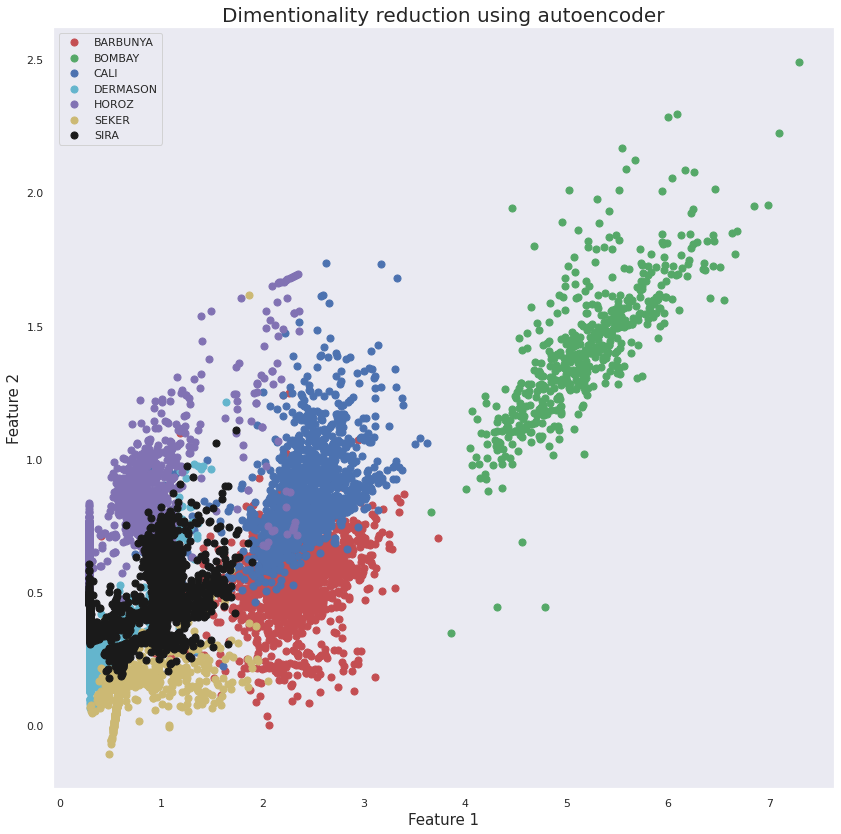

In [ ]:
fig = plt.figure(figsize = (14,14))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Feature 1', fontsize = 15)
ax.set_ylabel('Feature 2', fontsize = 15)
ax.set_title('Dimentionality reduction using autoencoder',fontsize=20)
targets=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA']
colors=['r','g','b','c','m','y','k']
for target, color in zip(targets,colors):
    indices = encoder_df['Class'] == target
    ax.scatter(encoder_df.loc[indices,'feature 1'],encoder_df.loc[indices,'feature 2'],c=color,s=50)
ax.legend(targets)
ax.grid()

Above, we have obtained using our trained autoencoder, the dimensionally reduced version of the dataset from sixteen to two variables. We observe similar clustering patterns in this case too.

BOMBAY class is seen distinct without any diffusion with other classes.

The sky-blue and black variants, which are DERMASON and SIRA respectively have much overlap.

The red and dark blue variants, which are BARBUNYA and CALI respectively have observable overlap.

All the above observations are apparent in the confusion matrix constructed below.

From all the visualizations done on the two feature version of the transformed datasets, we see the bottleneck problem of the overlap between two classes as mentioned above. 

**After having done dimensionality reduction using PCA and Autoencoders, let us compare their performance on classification**

For comparison purposes, I chosen a SVM classifier with radial basis function (rbf) kernel. 

**PCA**

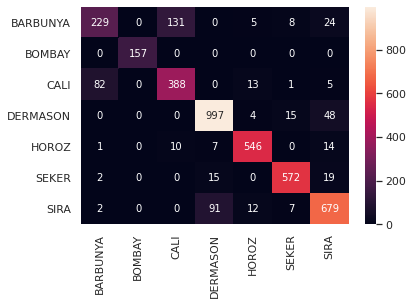

In [ ]:
rbf_pc2 = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf_pc2.fit(x_pc2_train,y_pc2_train)
y_rbf_pc2_pred = rbf_pc2.predict(x_pc2_test)
confusion_matrix_rbf_pc2 = pd.DataFrame(confusion_matrix(y_pc2_test,y_rbf_pc2_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf_pc2,annot=True,fmt='g')

In [ ]:
print(classification_report(y_pc2_test,y_rbf_pc2_pred,digits=4))

              precision    recall  f1-score   support

           0     0.7247    0.5768    0.6424       397
           1     1.0000    1.0000    1.0000       157
           2     0.7335    0.7935    0.7623       489
           3     0.8982    0.9370    0.9172      1064
           4     0.9414    0.9446    0.9430       578
           5     0.9486    0.9408    0.9447       608
           6     0.8606    0.8584    0.8595       791

    accuracy                         0.8737      4084
   macro avg     0.8724    0.8644    0.8670      4084
weighted avg     0.8718    0.8737    0.8717      4084



**AUTOENCODER**

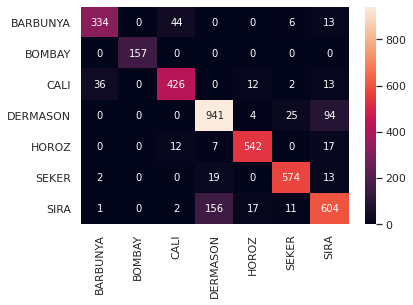

In [ ]:
rbf_enc = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf_enc.fit(x_enc_train,y_enc_train)
y_rbf_enc_pred = rbf_enc.predict(x_enc_test)
confusion_matrix_rbf_enc = pd.DataFrame(confusion_matrix(y_enc_test,y_rbf_enc_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf_enc,annot=True,fmt='g')

In [ ]:
print(classification_report(y_enc_test,y_rbf_enc_pred,digits=4))

              precision    recall  f1-score   support

           0     0.8954    0.8413    0.8675       397
           1     1.0000    1.0000    1.0000       157
           2     0.8802    0.8712    0.8756       489
           3     0.8379    0.8844    0.8605      1064
           4     0.9426    0.9377    0.9402       578
           5     0.9288    0.9441    0.9364       608
           6     0.8011    0.7636    0.7819       791

    accuracy                         0.8761      4084
   macro avg     0.8980    0.8918    0.8946      4084
weighted avg     0.8760    0.8761    0.8757      4084



On observing the classification reports and confusion matrices on both datasets obtained from PCA and Autoencoder, we observe that:

For PCA : Accuracy = 87.37 %

For Autoencoder: Accuracy = 89.81 %

We could furthur do hyperparameter tuning for the radial svm classifier to obtain better classification results but we leave that work for later in the analysis.

**t-SNE : t-DISTRIBUTED STOCHASTIC NEIGHBOUR EMBEDDINGS** 

We can obtain a better visualization of the data by choosing a different method for dimentionality reduction like t-SNE. t-SNE is a non-linear dimentionality reduction technique. It's implementation is shown below:

In [ ]:
tsne = TSNE(n_components=2,perplexity=50)
tsne_data = tsne.fit_transform(x_scaled)

In [ ]:
tsne.get_params()

{'angle': 0.5,
 'early_exaggeration': 12.0,
 'init': 'random',
 'learning_rate': 200.0,
 'method': 'barnes_hut',
 'metric': 'euclidean',
 'min_grad_norm': 1e-07,
 'n_components': 2,
 'n_iter': 1000,
 'n_iter_without_progress': 300,
 'n_jobs': None,
 'perplexity': 50,
 'random_state': None,
 'verbose': 0}

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


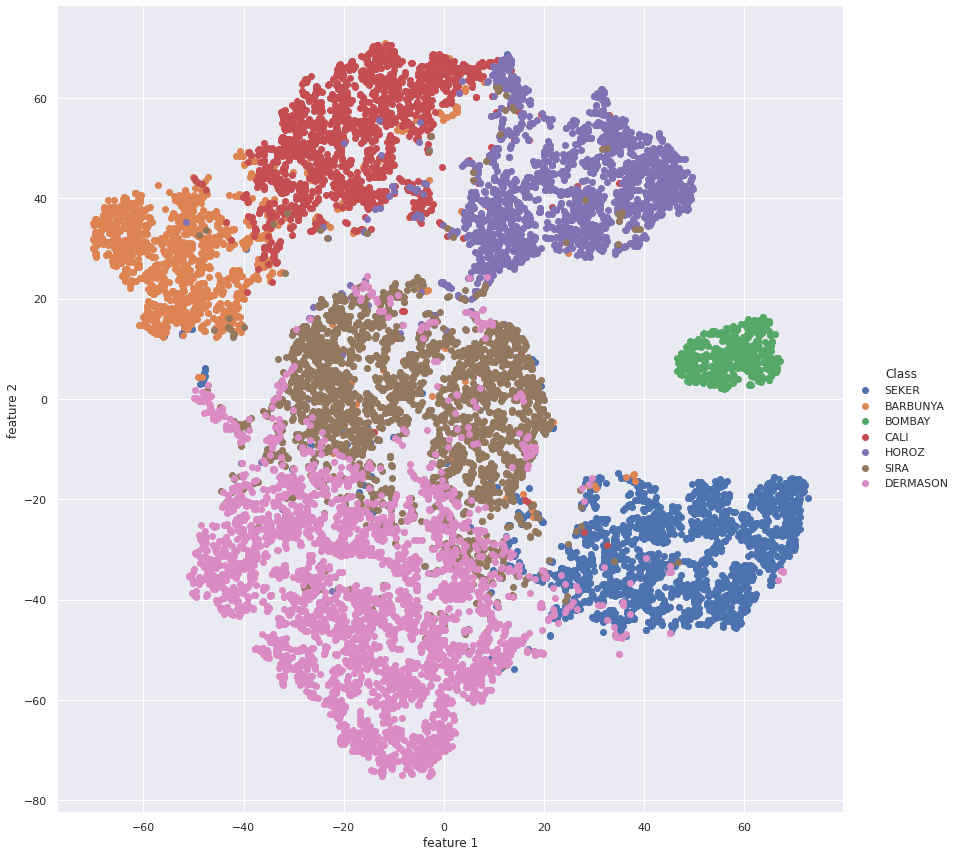

In [ ]:
df_tsne = pd.DataFrame(data=tsne_data,columns=['feature 1','feature 2'])
x_tsne = df_tsne.copy()
x_tsne = np.array(x_tsne)
df_tsne=pd.concat([df_tsne,df[['Class']]],axis=1)
sns.FacetGrid(df_tsne, hue="Class", size=12).map(plt.scatter, 'feature 1', 'feature 2').add_legend()
plt.show()

In [ ]:
dff = pd.DataFrame(x_tsne)
dff.to_csv('tsne.csv',index=False)

In [ ]:
dff = pd.read_csv('tsne.csv')

In [ ]:
x_tsne = np.array(dff)

In [ ]:
x_tnew_train, x_tnew_test, y_tnew_train, y_tnew_test=train_test_split(x_tsne,y_int,test_size=.3,random_state=22)

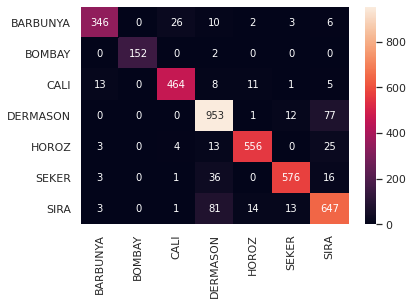

In [ ]:
rbf_tsne = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf_tsne.fit(x_tnew_train,y_tnew_train)
y_rbf_tsne_pred = rbf_tsne.predict(x_tnew_test)
confusion_matrix_rbf_tsne = pd.DataFrame(confusion_matrix(y_tnew_test,y_rbf_tsne_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf_tsne,annot=True,fmt='g')

In [ ]:
print(classification_report(y_tnew_test,y_rbf_tsne_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9402    0.8804    0.9093       393
           1     1.0000    0.9870    0.9935       154
           2     0.9355    0.9243    0.9299       502
           3     0.8640    0.9137    0.8882      1043
           4     0.9521    0.9251    0.9384       601
           5     0.9521    0.9114    0.9313       632
           6     0.8338    0.8524    0.8430       759

    accuracy                         0.9045      4084
   macro avg     0.9254    0.9135    0.9191      4084
weighted avg     0.9062    0.9045    0.9050      4084



**PLOTTING DECISION BOUNDARIES**

In this section, we plot the decision boundaries for the dimensionally tranformed and reduced versions of our dataset using K-Nearest Neighbours Classifier. To find the optimal value of k, we may run a for loop between 1 and 40 and choose the value which gives minimum error rate.

For plotting the decision boundaries, the following function is made use of:

In [ ]:
def plot_decision_boundaries(X, y, model_class, **model_params):
    # Instantiate the model object
    model = model_class(**model_params)
    # Fits the model with the reduced data
    model.fit(X, y)

    # Step size of the mesh. Decrease to increase the quality of the VQ.
    h = .02     # point in the mesh [x_min, m_max]x[y_min, y_max].    

    # Plot the decision boundary. For that, we will assign a color to each
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    # Meshgrid creation
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Obtain labels for each point in mesh using the model.
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])    

    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),np.arange(y_min, y_max, 0.1))
    # Predictions to obtain the classification results
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    # Plotting
    plt.contourf(xx, yy, Z, alpha=0.4)
    for label in np.unique(y):
      indices = np.where(y == label)
      plt.scatter(X[indices,0],X[indices,1],alpha=0.8,label='{}'.format(idx2class[label]))

    plt.legend(loc='lower right')
    plt.xlabel("feature 1",fontsize=15)
    plt.ylabel("feature 2",fontsize=15)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    return plt

**KNN on PCA-2**

Text(0, 0.5, 'Mean Error')

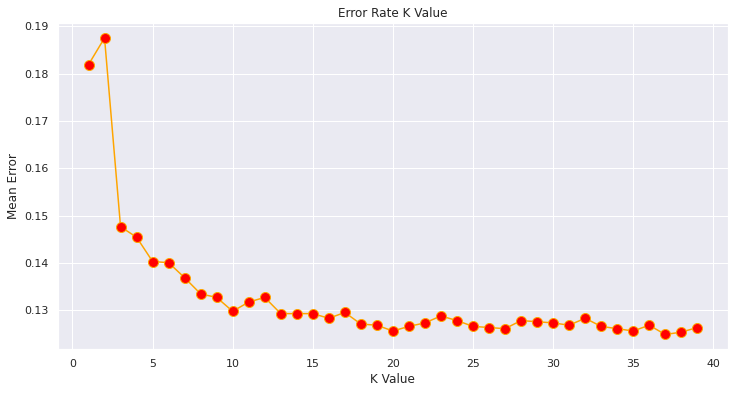

In [ ]:
error = []
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_pc2_train,y_pc2_train)
    pred_i = knn.predict(x_pc2_test)
    error.append(np.mean(pred_i != y_pc2_test))
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='orange',  marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

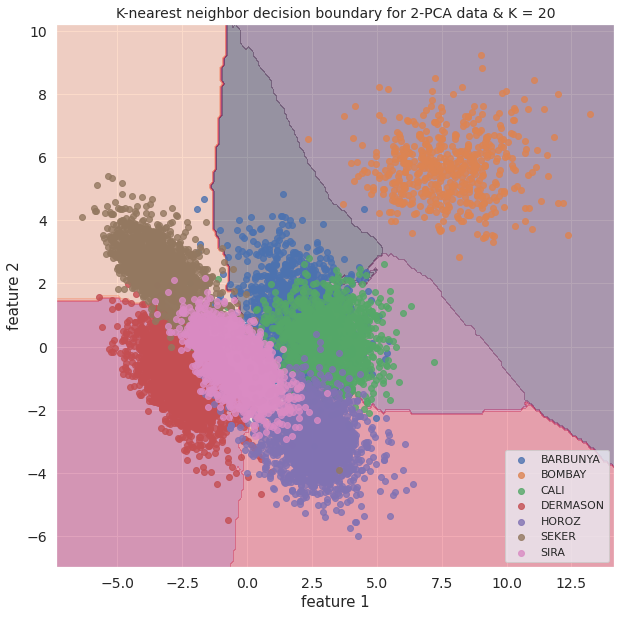

In [ ]:
plt.figure(figsize=[10,10])
plt.title('K-nearest neighbor decision boundary for 2-PCA data & K = 20',fontsize=14)
plot_decision_boundaries(x_pca2_cmps,y_int,KNeighborsClassifier,n_neighbors=20)
plt.show()

In [ ]:
knn_pca = KNeighborsClassifier(n_neighbors=20)
knn_pca.fit(x_pc2_train,y_pc2_train)
knn_pca_pred = knn_pca.predict(x_pc2_test)
print(classification_report(y_pc2_test,knn_pca_pred,digits=4))

              precision    recall  f1-score   support

           0     0.7106    0.6247    0.6649       397
           1     1.0000    1.0000    1.0000       157
           2     0.7560    0.7669    0.7614       489
           3     0.9064    0.9286    0.9174      1064
           4     0.9379    0.9412    0.9396       578
           5     0.9330    0.9391    0.9361       608
           6     0.8600    0.8698    0.8649       791

    accuracy                         0.8744      4084
   macro avg     0.8720    0.8672    0.8692      4084
weighted avg     0.8724    0.8744    0.8731      4084



**KNN on autoencoder output**

Text(0, 0.5, 'Mean Error')

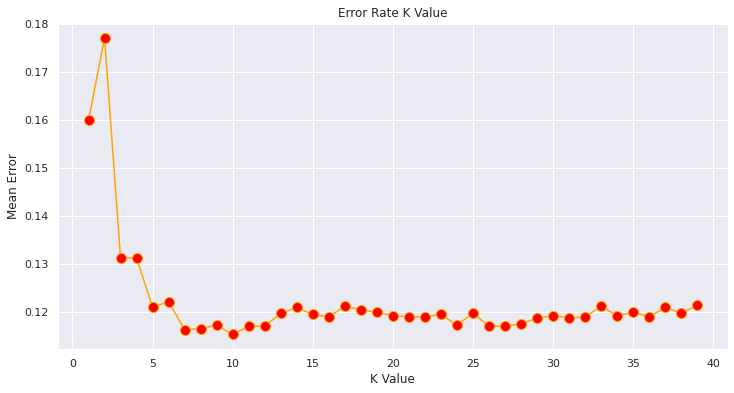

In [ ]:
error = []
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_enc_train,y_enc_train)
    pred_i = knn.predict(x_enc_test)
    error.append(np.mean(pred_i != y_enc_test))
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='orange',  marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

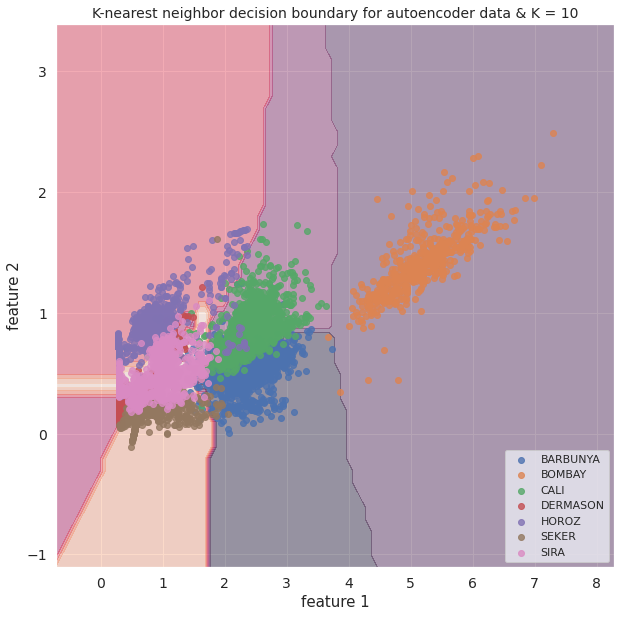

In [ ]:
plt.figure(figsize=[10,10])
plt.title('K-nearest neighbor decision boundary for autoencoder data & K = 10',fontsize=14)
plot_decision_boundaries(x_enc,y_int,KNeighborsClassifier,n_neighbors=10)
plt.show()

In [ ]:
knn_enc = KNeighborsClassifier(n_neighbors=15)
knn_enc.fit(x_enc_train,y_enc_train)
knn_enc_pred = knn_enc.predict(x_enc_test)
print(classification_report(y_enc_test,knn_enc_pred,digits=4))

              precision    recall  f1-score   support

           0     0.7867    0.7431    0.7642       397
           1     1.0000    1.0000    1.0000       157
           2     0.8302    0.8098    0.8199       489
           3     0.8852    0.9060    0.8955      1064
           4     0.8870    0.9100    0.8984       578
           5     0.9120    0.9375    0.9246       608
           6     0.8268    0.8028    0.8146       791

    accuracy                         0.8675      4084
   macro avg     0.8754    0.8727    0.8739      4084
weighted avg     0.8664    0.8675    0.8668      4084



**KNN on t-SNE**

In [ ]:
plt.figure(figsize=[10,10])
plt.title('K-nearest neighbor decision boundary for 2-PCA data & K =7',fontsize=14)
plot_decision_boundaries(x_tsne,y_int,KNeighborsClassifier,n_neighbors=7)
plt.show()

In [ ]:
error = []
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_tnew_train,y_tnew_train)
    pred_i = knn.predict(x_tnew_test)
    error.append(np.mean(pred_i != y_tnew_test))

Text(0, 0.5, 'Mean Error')

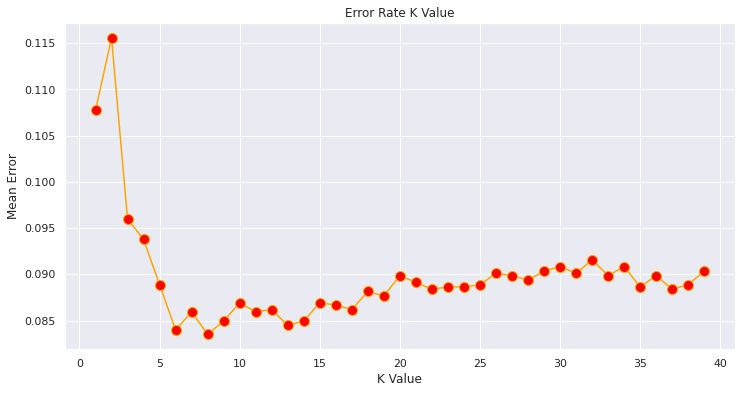

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='orange',  marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

In [ ]:
#plt.figure(figsize=[10,10])
#plt.title('K-nearest neighbor decision boundary for t-SNE data & K =5',fontsize=14)
#plot_decision_boundaries(x_tsne,y_int,KNeighborsClassifier,n_neighbors=6)
#plt.show()

#colab crashes after running out of memory

**DEVELOPING CLASSIFICATION MODEL**

We now focus on developing a multi-class classification model for the given dataset. We will try a few combinations based on observations from data visualization, feature selection and feature transformation done in previous sections to come at a conclusion for the same.

**Support vector machine (SVM)**

**SVM LINEAR**

In [ ]:
linear = svm.SVC(kernel='linear',C=1,decision_function_shape='ovo')
linear.fit(x_sc_train,y_sc_train)
y_linear_pred = linear.predict(x_sc_test)

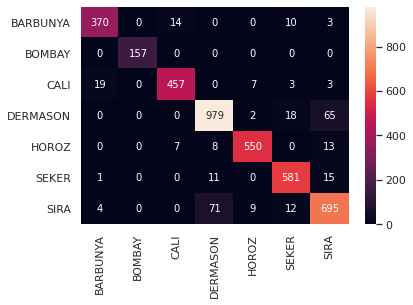

In [ ]:
confusion_matrix_linear = pd.DataFrame(confusion_matrix(y_sc_test,
y_linear_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_linear,annot=True,fmt='g')

In [ ]:
print(classification_report(y_sc_test,y_linear_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9391    0.9320    0.9355       397
           1     1.0000    1.0000    1.0000       157
           2     0.9561    0.9346    0.9452       489
           3     0.9158    0.9201    0.9180      1064
           4     0.9683    0.9516    0.9599       578
           5     0.9311    0.9556    0.9432       608
           6     0.8753    0.8786    0.8770       791

    accuracy                         0.9278      4084
   macro avg     0.9408    0.9389    0.9398      4084
weighted avg     0.9280    0.9278    0.9278      4084



**SVM RADIAL**

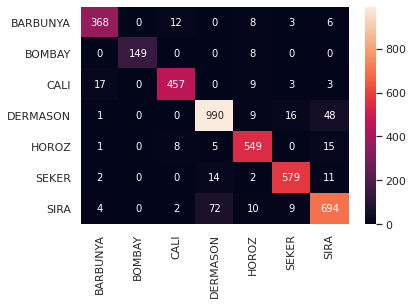

In [ ]:
rbf = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf.fit(x_sc_train,y_sc_train)
y_rbf_pred = rbf.predict(x_sc_test)
confusion_matrix_rbf = pd.DataFrame(confusion_matrix(y_sc_test,
y_rbf_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf,annot=True,fmt='g')

In [ ]:
print(classification_report(y_sc_test,y_rbf_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9364    0.9270    0.9316       397
           1     1.0000    0.9490    0.9739       157
           2     0.9541    0.9346    0.9442       489
           3     0.9158    0.9305    0.9231      1064
           4     0.9227    0.9498    0.9361       578
           5     0.9492    0.9523    0.9507       608
           6     0.8932    0.8774    0.8852       791

    accuracy                         0.9270      4084
   macro avg     0.9388    0.9315    0.9350      4084
weighted avg     0.9272    0.9270    0.9270      4084



**SVM CUBIC**

In [ ]:
poly = svm.SVC(kernel='poly',degree=3,C=1,decision_function_shape='ovo')
poly.fit(x_sc_train,y_sc_train)
y_poly_pred = poly.predict(x_sc_test)

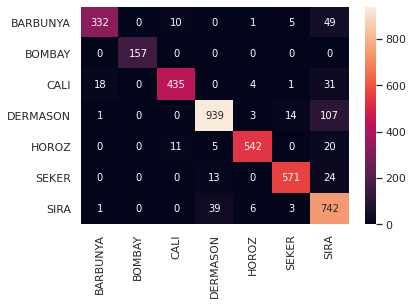

In [ ]:
confusion_matrix_poly = pd.DataFrame(confusion_matrix(y_sc_test,
y_poly_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_poly,annot=True,fmt='g')

In [ ]:
print(classification_report(y_sc_test,y_poly_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9432    0.8363    0.8865       397
           1     1.0000    1.0000    1.0000       157
           2     0.9539    0.8896    0.9206       489
           3     0.9428    0.8825    0.9117      1064
           4     0.9748    0.9377    0.9559       578
           5     0.9613    0.9391    0.9501       608
           6     0.7626    0.9381    0.8413       791

    accuracy                         0.9104      4084
   macro avg     0.9341    0.9176    0.9237      4084
weighted avg     0.9187    0.9104    0.9120      4084



**SVM radial with data after dropping unimportant features**

In [ ]:
df_rbf_lite = df_f_scaled.copy()
df_rbf_lite.drop(['Eccentricity','AspectRation','EquivDiameter'],axis=1,inplace=True)
x_lite = np.array(df_rbf_lite)

In [ ]:
df_feather = df_f_scaled.copy()
df_feather.drop(['Area','AspectRation','Eccentricity','ConvexArea','EquivDiameter','Extent','Solidity','roundness','ShapeFactor2','ShapeFactor3','ShapeFactor4'],axis=1,inplace=True)
x_feather = np.array(df_feather)

In [ ]:
x_train_lite, x_test_lite, y_train_lite,y_test_lite=train_test_split(x_lite,y_int,test_size=.3,
                                                   random_state=22)
x_train_feather, x_test_feather,y_train_feather,y_test_feather=train_test_split(x_feather,y_int,test_size=.3,
                                                   random_state=22)

In [ ]:
rbf_lite = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf_lite.fit(x_lite,y_int)
y_rbf_lite_pred = rbf_lite.predict(x_test_lite)

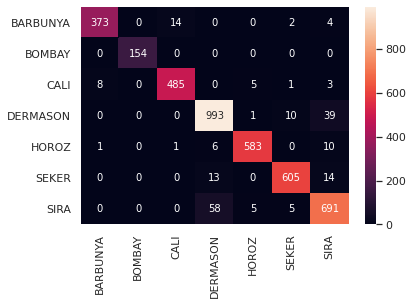

In [ ]:
confusion_matrix_rbf_lite = pd.DataFrame(confusion_matrix(y_test_lite,
y_rbf_lite_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf_lite,annot=True,fmt='g')

In [ ]:
print(classification_report(y_test_lite,y_rbf_lite_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9764    0.9491    0.9626       393
           1     1.0000    1.0000    1.0000       154
           2     0.9700    0.9661    0.9681       502
           3     0.9280    0.9521    0.9399      1043
           4     0.9815    0.9700    0.9757       601
           5     0.9711    0.9573    0.9641       632
           6     0.9080    0.9104    0.9092       759

    accuracy                         0.9510      4084
   macro avg     0.9622    0.9579    0.9599      4084
weighted avg     0.9514    0.9510    0.9511      4084



**Feather model with only five features**

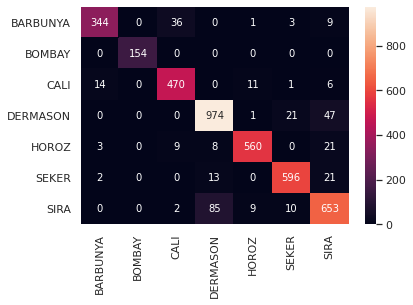

In [ ]:
rbf_feather = svm.SVC(kernel='rbf',gamma=1,C=1,decision_function_shape='ovo')
rbf_feather.fit(x_feather,y_int)
y_rbf_feather_pred = rbf_feather.predict(x_test_feather)
confusion_matrix_rbf_feather = pd.DataFrame(confusion_matrix(y_test_feather,
y_rbf_feather_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_rbf_feather,annot=True,fmt='g')

In [ ]:
print(classification_report(y_test_feather,y_rbf_feather_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9477    0.8753    0.9101       393
           1     1.0000    1.0000    1.0000       154
           2     0.9091    0.9363    0.9225       502
           3     0.9019    0.9338    0.9176      1043
           4     0.9622    0.9318    0.9467       601
           5     0.9445    0.9430    0.9438       632
           6     0.8626    0.8603    0.8615       759

    accuracy                         0.9185      4084
   macro avg     0.9326    0.9258    0.9289      4084
weighted avg     0.9190    0.9185    0.9185      4084



**Multi-layer perceptron (MLP)**

In [ ]:
class ClassifierDataset(Dataset):
  def __init__(self, X_data, y_data):
      self.X_data = X_data
      self.y_data = y_data
  def __getitem__(self, index):
      return self.X_data[index], self.y_data[index]
  def __len__ (self):
      return len(self.X_data)
train_dataset = ClassifierDataset(torch.from_numpy(x_sc_train).float(), torch.from_numpy(y_sc_train).long())
val_dataset = ClassifierDataset(torch.from_numpy(x_sc_test).float(), torch.from_numpy(y_sc_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=32)
val_loader = DataLoader(dataset=val_dataset,batch_size=1)

class Net(nn.Module):
    def __init__(self):
        super(Net,self).__init__()
        self.relu = nn.ReLU()
        self.l1 = nn.Linear(16,12)
        self.l2 = nn.Linear(12,3)
        self.l3 = nn.Linear(3,7)
    def forward(self, y):
        y = self.l1(y)
        y = self.relu(y)
        y = self.l2(y)
        y = self.relu(y)
        y = self.l3(y)
        return y
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = Net()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr=0.003)
print(model)

Net(
  (relu): ReLU()
  (l1): Linear(in_features=16, out_features=12, bias=True)
  (l2): Linear(in_features=12, out_features=3, bias=True)
  (l3): Linear(in_features=3, out_features=7, bias=True)
)


In [ ]:
def multi_acc(y_pred, y_test):
    y_pred_softmax = torch.log_softmax(y_pred, dim = 1)
    _, y_pred_tags = torch.max(y_pred_softmax, dim = 1)    
    correct_pred = (y_pred_tags == y_test).float()
    acc = correct_pred.sum() / len(correct_pred)
    acc = torch.round(acc * 100)
    return acc
accuracy_stats = {'train': [],"val": []}
loss_stats = {'train': [],"val": []}
epochs = 100
print("Begin training.")
for e in tqdm(range(1, epochs+1)):
    # TRAINING
    train_epoch_loss = 0
    train_epoch_acc = 0
    model.train()
    for X_train_batch, y_train_batch in train_loader:
        X_train_batch, y_train_batch = X_train_batch.to(device), y_train_batch.to(device)
        optimizer.zero_grad()
        y_train_pred = model(X_train_batch)
        train_loss = criterion(y_train_pred, y_train_batch)
        train_acc = multi_acc(y_train_pred, y_train_batch)
        train_loss.backward()
        optimizer.step()
        train_epoch_loss += train_loss.item()
        train_epoch_acc += train_acc.item()
    # VALIDATION    
    with torch.no_grad():
        val_epoch_loss = 0
        val_epoch_acc = 0 
        model.eval()
        for X_val_batch, y_val_batch in val_loader:
            X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)
            y_val_pred = model(X_val_batch)
            val_loss = criterion(y_val_pred, y_val_batch)
            val_acc = multi_acc(y_val_pred, y_val_batch)
            val_epoch_loss += val_loss.item()
            val_epoch_acc += val_acc.item()
    loss_stats['train'].append(train_epoch_loss/len(train_loader))
    loss_stats['val'].append(val_epoch_loss/len(val_loader))
    accuracy_stats['train'].append(train_epoch_acc/len(train_loader))
    accuracy_stats['val'].append(val_epoch_acc/len(val_loader))
    print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(train_loader):.5f} | Val Loss: {val_epoch_loss/len(val_loader):.5f} | Train Acc: {train_epoch_acc/len(train_loader):.3f}| Val Acc: {val_epoch_acc/len(val_loader):.3f}')

Begin training.


Epoch 001: | Train Loss: 1.08092 | Val Loss: 0.65662 | Train Acc: 54.218| Val Acc: 78.110
Epoch 002: | Train Loss: 0.46830 | Val Loss: 0.40880 | Train Acc: 84.128| Val Acc: 88.051
Epoch 003: | Train Loss: 0.35619 | Val Loss: 0.35989 | Train Acc: 89.450| Val Acc: 89.153
Epoch 004: | Train Loss: 0.31933 | Val Loss: 0.33352 | Train Acc: 90.527| Val Acc: 89.349
Epoch 005: | Train Loss: 0.29645 | Val Loss: 0.31307 | Train Acc: 90.721| Val Acc: 89.789
Epoch 006: | Train Loss: 0.27987 | Val Loss: 0.29833 | Train Acc: 91.064| Val Acc: 90.304
Epoch 007: | Train Loss: 0.26787 | Val Loss: 0.28501 | Train Acc: 91.336| Val Acc: 90.818
Epoch 008: | Train Loss: 0.25847 | Val Loss: 0.27545 | Train Acc: 91.510| Val Acc: 90.989
Epoch 009: | Train Loss: 0.25111 | Val Loss: 0.26765 | Train Acc: 91.691| Val Acc: 91.259
Epoch 010: | Train Loss: 0.24499 | Val Loss: 0.26104 | Train Acc: 91.839| Val Acc: 91.430
Epoch 011: | Train Loss: 0.23996 | Val Loss: 0.25579 | Train Acc: 91.960| Val Acc: 91.503
Epoch 012:

Text(0.5, 1.0, 'Train-Val Loss/Epoch')

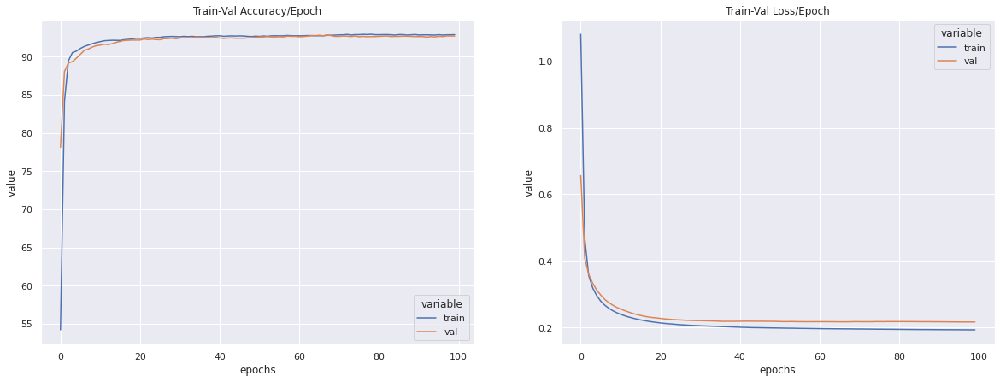

In [ ]:
train_val_acc_df = pd.DataFrame.from_dict(accuracy_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})
train_val_loss_df = pd.DataFrame.from_dict(loss_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})
# Plot the dataframes
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,7))
sns.lineplot(data=train_val_acc_df, x = "epochs", y="value", hue="variable",  ax=axes[0]).set_title('Train-Val Accuracy/Epoch')
sns.lineplot(data=train_val_loss_df, x = "epochs", y="value", hue="variable", ax=axes[1]).set_title('Train-Val Loss/Epoch')

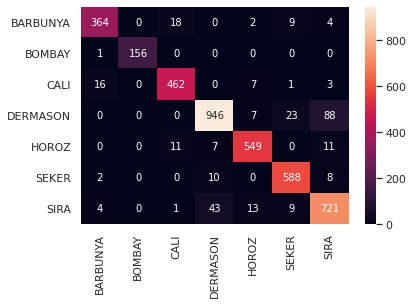

In [ ]:
y_mlp_pred = []
with torch.no_grad():
    model.eval()
    x_test = torch.from_numpy(x_sc_test)
    x_test = x_test.to(device)
    y_test_pred = model(x_test.float())
    y_mlp_pred = torch.argmax(y_test_pred,dim=1)
y_mlp_pred = y_mlp_pred.numpy()
confusion_matrix_df = pd.DataFrame(confusion_matrix(y_sc_test,
y_mlp_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_df,annot=True,fmt='g')

In [ ]:
print(classification_report(y_sc_test,y_mlp_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9406    0.9169    0.9286       397
           1     1.0000    0.9936    0.9968       157
           2     0.9390    0.9448    0.9419       489
           3     0.9404    0.8891    0.9140      1064
           4     0.9498    0.9498    0.9498       578
           5     0.9333    0.9671    0.9499       608
           6     0.8635    0.9115    0.8868       791

    accuracy                         0.9270      4084
   macro avg     0.9381    0.9390    0.9383      4084
weighted avg     0.9279    0.9270    0.9271      4084



**XGBoost Classifier**

In [ ]:
xgb = XGBClassifier()
xgb.fit(x_sc_train,y_sc_train)
y_xgb_pred = xgb.predict(x_sc_test)
confusion_matrix_xgb = pd.DataFrame(confusion_matrix(y_sc_test,y_xgb_pred)).rename(columns=idx2class, index=idx2class)
sns.heatmap(confusion_matrix_xgb,annot=True,fmt='g')

In [ ]:
print(classification_report(y_sc_test,y_xgb_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9398    0.9446    0.9422       397
           1     1.0000    1.0000    1.0000       157
           2     0.9581    0.9346    0.9462       489
           3     0.9095    0.9258    0.9176      1064
           4     0.9679    0.9394    0.9535       578
           5     0.9418    0.9589    0.9503       608
           6     0.8807    0.8774    0.8790       791

    accuracy                         0.9290      4084
   macro avg     0.9426    0.9401    0.9412      4084
weighted avg     0.9293    0.9290    0.9290      4084

